<a href="https://www.kaggle.com/code/utkarshx27/exploring-dc-marijuana-arrests-insights-trends?scriptVersionId=130432828" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/marijuana-arrests-in-columbia/Marijuana_Arrests.csv


In [2]:
from matplotlib import pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Data Overview

In [3]:
df = pd.read_csv('/kaggle/input/marijuana-arrests-in-columbia/Marijuana_Arrests.csv')
df.head()

,TYPE,ADULT_JUVENILE,YEAR,DATETIME,CCN,AGE,OFFENSE_DISTRICT,OFFENSE_PSA,OFFENSE_BLOCKX,OFFENSE_BLOCKY,...,ADDRESS,ARREST_BLOCKX,ARREST_BLOCKY,GIS_ID,CREATOR,CREATED,EDITOR,EDITED,OBJECTID,GLOBALID
0,Possession,Adult,2012,2012/01/01 06:00:00+00,b';\xc8k~\xa4iJ',20.0,5D,501.0,399700.0,137900.0,...,FLORIDA AVE NE,401400.0,136900.0,MARIJUANA_ARRESTS_1,JLAY,2022/10/18 21:51:23+00,JLAY,2022/10/18 21:51:23+00,12481,{4654D30A-5B56-4E19-8FC2-B19CC723C747}
1,Possession,Adult,2012,2012/01/01 06:00:00+00,b';\xc8k~\xa4iJ',23.0,5D,501.0,399700.0,137900.0,...,FLORIDA AVE NE,401400.0,136900.0,MARIJUANA_ARRESTS_2,JLAY,2022/10/18 21:51:23+00,JLAY,2022/10/18 21:51:23+00,12482,{1C0EBA86-27EC-4B8E-8ABB-6EFFF03A0AA2}
2,Possession,Adult,2012,2012/01/01 06:00:00+00,b't6\xa0\xac\xec`\xa4',46.0,7D,707.0,399700.0,130600.0,...,3300 BLOCK OF BROTHERS PL SE,399700.0,130600.0,MARIJUANA_ARRESTS_3,JLAY,2022/10/18 21:51:23+00,JLAY,2022/10/18 21:51:23+00,12483,{88080D68-CFA3-41E6-AA69-5DB7F950A134}
3,Possession,Adult,2012,2012/01/01 09:35:00+00,b'\xbe\x1d\xa7\xf5\xffWx',30.0,6D,605.0,403300.0,134500.0,...,700 BLOCK OF 32ND ST SE,NaN,NaN,MARIJUANA_ARRESTS_4,JLAY,2022/10/18 21:51:23+00,JLAY,2022/10/18 21:51:23+00,12484,{7769980A-5F36-4B3C-91CF-D1A3A94CE52E}
4,Possession with intent to distribute,Adult,2012,2012/01/02 19:40:00+00,b'\xbb\xc0\x8e\x94\x81\xac\xcd',29.0,6D,604.0,406400.0,135300.0,...,5300 BLOCK OF B ST SE,NaN,NaN,MARIJUANA_ARRESTS_5,JLAY,2022/10/18 21:51:23+00,JLAY,2022/10/18 21:51:23+00,12485,{5D5BEE85-DF16-41A1-BB49-0D16D0EE1320}


# Data Info

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13063 entries, 0 to 13062
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   TYPE                13063 non-null  object 
 1   ADULT_JUVENILE      13063 non-null  object 
 2   YEAR                13063 non-null  int64  
 3   DATETIME            13063 non-null  object 
 4   CCN                 12510 non-null  object 
 5   AGE                 12466 non-null  float64
 6   OFFENSE_DISTRICT    13063 non-null  object 
 7   OFFENSE_PSA         13036 non-null  float64
 8   OFFENSE_BLOCKX      12461 non-null  float64
 9   OFFENSE_BLOCKY      12461 non-null  float64
 10  DEFENDANT_PSA       12328 non-null  object 
 11  DEFENDANT_DISTRICT  12363 non-null  object 
 12  RACE                12510 non-null  object 
 13  ETHNICITY           12510 non-null  object 
 14  SEX                 12510 non-null  object 
 15  CATEGORY            13063 non-null  object 
 16  DESC

In [5]:
df = df.dropna()

# Summary statistics

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
YEAR,11333.0,2014.772787,2.728184,2012.0,2013.0,2014.0,2017.0,2021.0
AGE,11333.0,29.468190,10.192343,18.0,22.0,26.0,34.0,81.0
OFFENSE_PSA,11333.0,470.298862,189.594226,101.0,305.0,506.0,607.0,708.0
OFFENSE_BLOCKX,11333.0,400516.429895,3029.884987,390300.0,398100.0,400400.0,402200.0,407800.0
OFFENSE_BLOCKY,11333.0,136503.750110,3709.821476,127900.0,134300.0,137100.0,139100.0,147100.0
ARREST_BLOCKX,11333.0,400513.641578,3032.639409,390300.0,398100.0,400400.0,402200.0,407800.0
ARREST_BLOCKY,11333.0,136521.327098,3716.706960,128000.0,134300.0,137100.0,139100.0,147100.0
OBJECTID,11333.0,19244.046854,3705.830911,12481.0,16101.0,19289.0,22515.0,25514.0


# Distribution of arrests over time

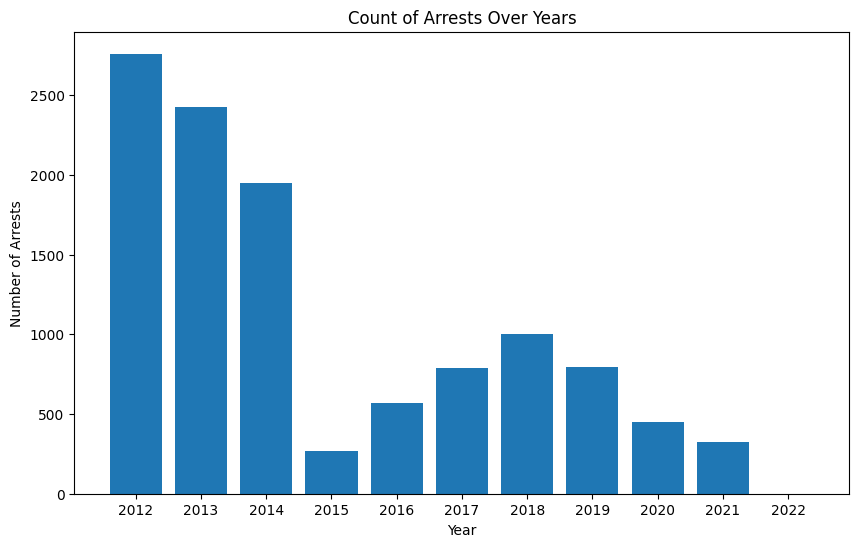

In [7]:
df['DATETIME'] = pd.to_datetime(df['DATETIME'])
df['YEAR'] = df['DATETIME'].dt.year
arrests_per_year = df['YEAR'].value_counts().sort_index()
plt.figure(figsize=(10, 6))
plt.bar(arrests_per_year.index, arrests_per_year.values)
plt.xlabel('Year')
plt.ylabel('Number of Arrests')
plt.title('Count of Arrests Over Years')
plt.xticks(arrests_per_year.index)
plt.show()

In [8]:
df['ETHNICITY'].unique()

array(['N ', 'U ', 'H ', 'N', 'U', 'H'], dtype=object)

# Demographic analysis

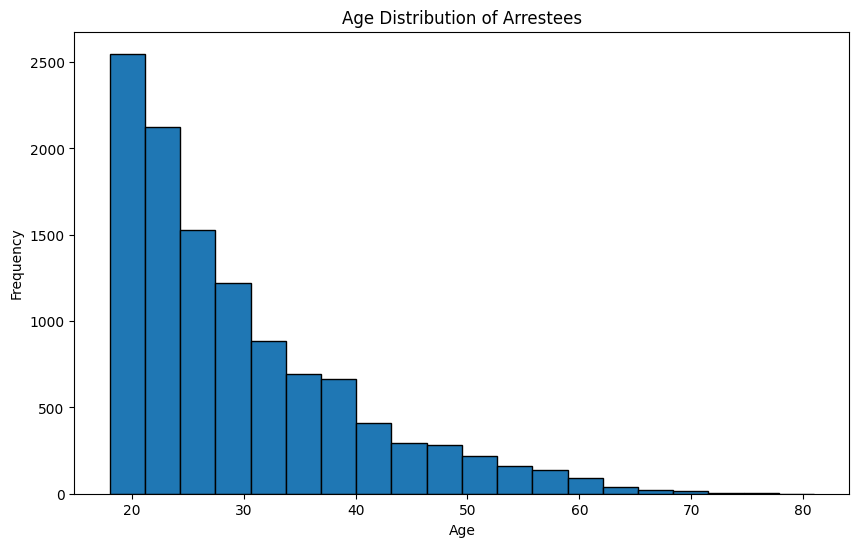

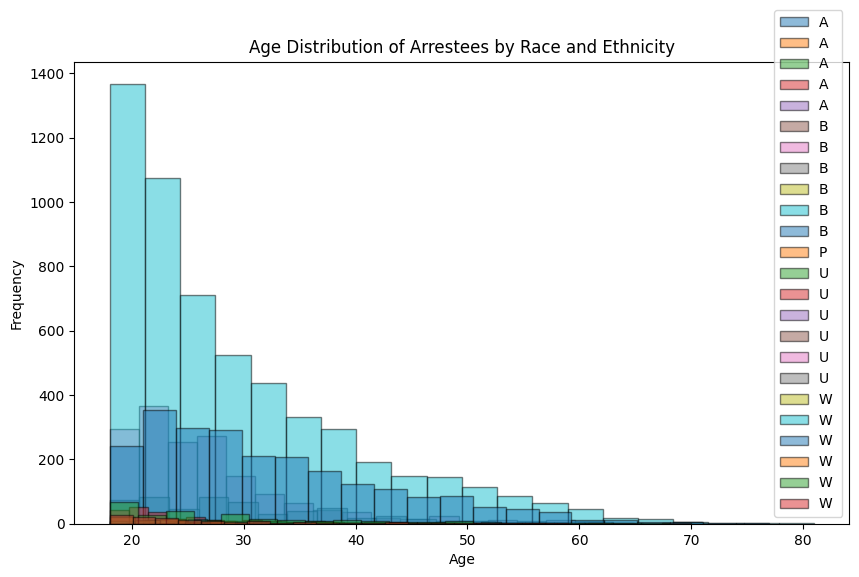

In [9]:
plt.figure(figsize=(10, 6))
plt.hist(df['AGE'],edgecolor='black', bins=20)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Distribution of Arrestees')
plt.show()
grouped = df.groupby(['RACE', 'ETHNICITY'])
plt.figure(figsize=(10, 6))
for group, data in grouped:
    plt.hist(data['AGE'], bins=20,edgecolor='black', alpha=0.5, label=group)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Distribution of Arrestees by Race and Ethnicity')
plt.legend()
plt.show()

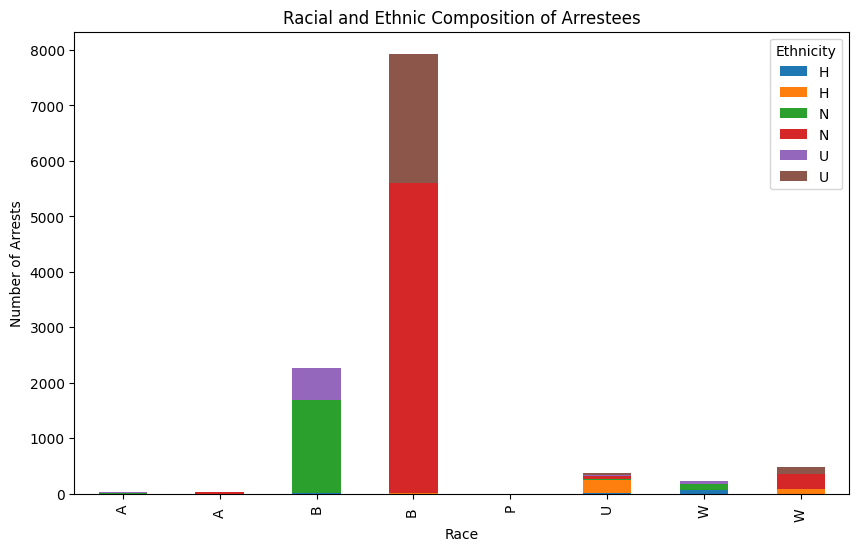

In [10]:
arrests_by_demographics = df.groupby(['RACE', 'ETHNICITY']).size().unstack()
arrests_by_demographics.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Race')
plt.ylabel('Number of Arrests')
plt.title('Racial and Ethnic Composition of Arrestees')
plt.legend(title='Ethnicity')
plt.show()

# Time patterns

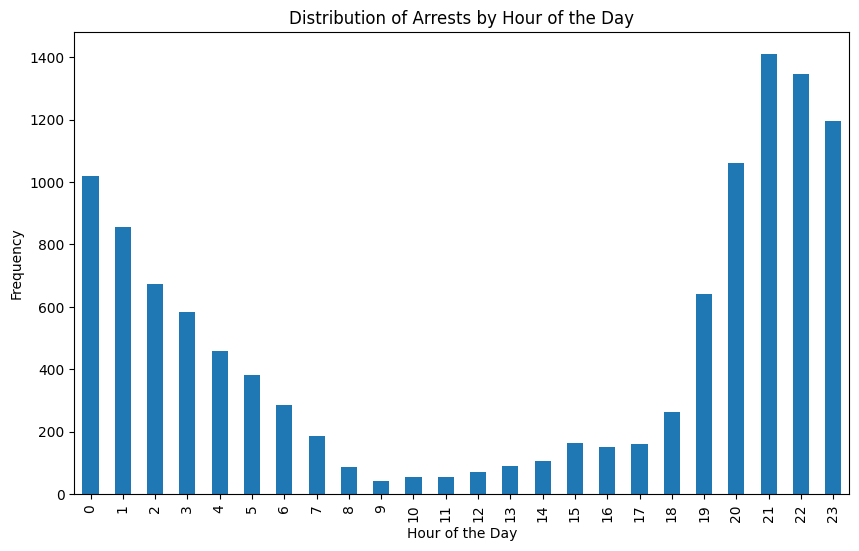

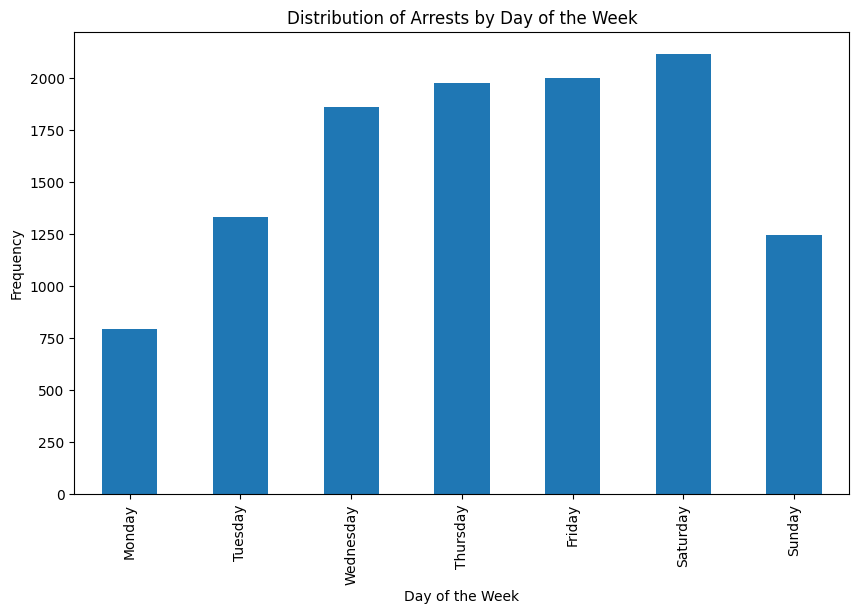

In [11]:
df['DATETIME'] = pd.to_datetime(df['DATETIME'])
df['HOUR_OF_DAY'] = df['DATETIME'].dt.hour
df['DAY_OF_WEEK'] = df['DATETIME'].dt.day_name()
arrests_by_hour = df['HOUR_OF_DAY'].value_counts().sort_index()
arrests_by_day = df['DAY_OF_WEEK'].value_counts().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.figure(figsize=(10, 6))
arrests_by_hour.plot(kind='bar')
plt.xlabel('Hour of the Day')
plt.ylabel('Frequency')
plt.title('Distribution of Arrests by Hour of the Day')
plt.show()

plt.figure(figsize=(10, 6))
arrests_by_day.plot(kind='bar')
plt.xlabel('Day of the Week')
plt.ylabel('Frequency')
plt.title('Distribution of Arrests by Day of the Week')
plt.show()

# Geographic Analysis

In [12]:
dc_map = folium.Map(location=[38.9072, -77.0369], zoom_start=12)

for index, row in df.iterrows():
    offense_coords = (row['OFFENSE_BLOCKX'], row['OFFENSE_BLOCKY'])
    arrest_coords = (row['ARREST_BLOCKX'], row['ARREST_BLOCKY'])
    
    folium.Marker(location=offense_coords, icon=folium.Icon(color='blue', icon='info-sign')).add_to(dc_map)
    folium.Marker(location=arrest_coords, icon=folium.Icon(color='red', icon='exclamation-sign')).add_to(dc_map)
dc_map